# end to end multi  class dog breed classification

this notebook builds an end-to-end multi-class image classifier ising TensorFlow 2.0 and TensorFlow HUb.

## 1. Problem
Identifying the breed of a dog given the image of the dog.

## 2. Data

The data is from Kaggle's dog breed identificatin competition.

https://www.kaggle.com/competitions/dog-breed-identification/overview

## 3. Evaluation

The evaluation is a file with prediction probabilities for each image and each dog breed.  

https://www.kaggle.com/competitions/dog-breed-identification/overview

## 4. Features

Some info about the data:
* We are looking at images (unstructured data) so it is probably best to use deep/transfer learning.
* There are 120 breeds of dogs (120 different classes)
* there are aroing 10,000 images in the training set with labels.
* there are around 10,000 imgaes in the test set (no labels as we try to predict them)

In [1]:
#!unzip '/content/drive/MyDrive/dog identification project/dog-breed-identification.zip' -d 'drive/MyDrive/dog identification project'

## Get our Workplace ready

* Import TensorFlow
* Import TensorFlow Hub
* Make sure we are using a GPU



In [3]:
# Import TensorFlow and necessary tools into colab
import tensorflow as tf
import tensorflow_hub as hub
print('TF version:',tf.__version__)
print('TF Hub version:', hub.__version__)

#check for GPU availabilty
print('GPU', 'available (YESSSS!!!!!)' if tf.config.list_physical_devices('GPU') else 'not available:(')

TF version: 2.14.0
TF Hub version: 0.15.0
GPU available (YESSSS!!!!!)


## Getting Data Ready and turning it into Tensors

With all machine learning models data needs to be in numerical data. Turning our images into numbers.

In [38]:
import pandas as pd

labels_csv = pd.read_csv('drive/MyDrive/dog identification project/labels.csv')
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [5]:
# How many images of each breed
labels_csv['breed'].value_counts()

scottish_deerhound      126
maltese_dog             117
afghan_hound            116
entlebucher             115
bernese_mountain_dog    114
                       ... 
golden_retriever         67
brabancon_griffon        67
komondor                 67
eskimo_dog               66
briard                   66
Name: breed, Length: 120, dtype: int64

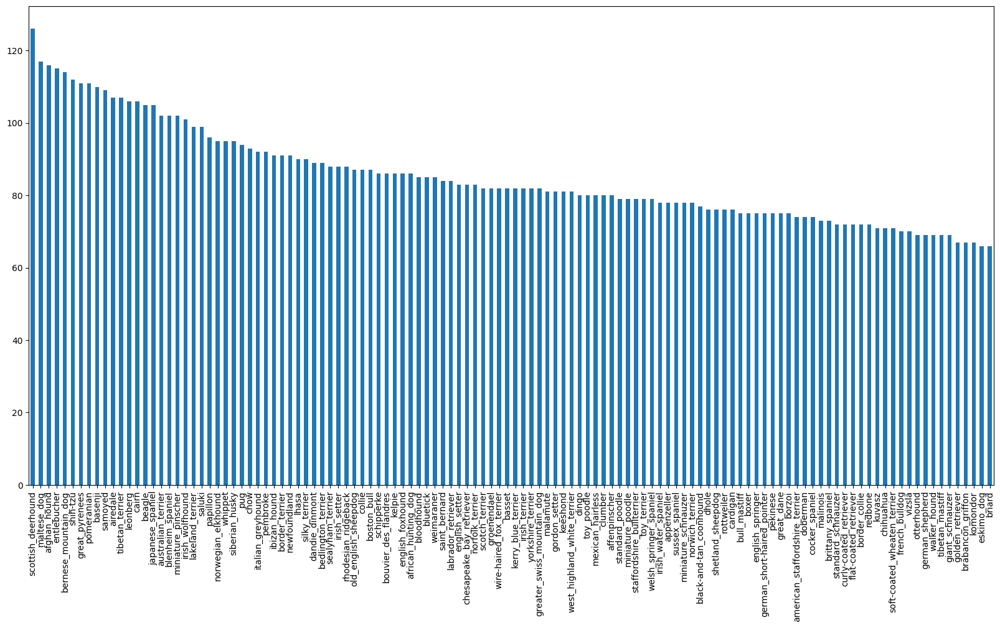

In [6]:
labels_csv['breed'].value_counts().plot.bar(figsize=(20,10));

In [ ]:
labels_csv['breed'].value_counts().median()

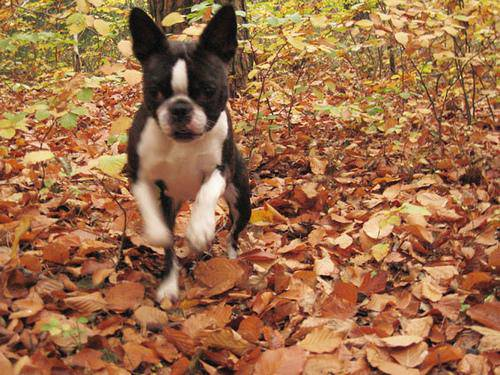

In [36]:
#let's view an image
import ee
from IPython.display import Image
Image('drive/My Drive/dog identification project/train/000bec180eb18c7604dcecc8fe0dba07.jpg')

### Getting images and their labels

Let's get a list of all of our images and pathnames

In [37]:
labels_csv.head()

NameError: ignored

In [10]:
filenames = ['drive/My Drive/dog identification project/train/' + fname + '.jpg' for fname in labels_csv['id']]

# Check first 10
filenames[:10]

['drive/My Drive/dog identification project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog identification project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog identification project/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog identification project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog identification project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog identification project/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog identification project/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog identification project/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog identification project/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog identification project/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [4]:
# Check if number of file names matches actual number of files
import os
if len(os.listdir('drive/MyDrive/dog identification project/train')) == len(filenames):
  print('Filenames match actual amount of files!! Proceed.')
else:
  print('Filenames do not match actual amount of files, check the target directory')


KeyboardInterrupt: ignored

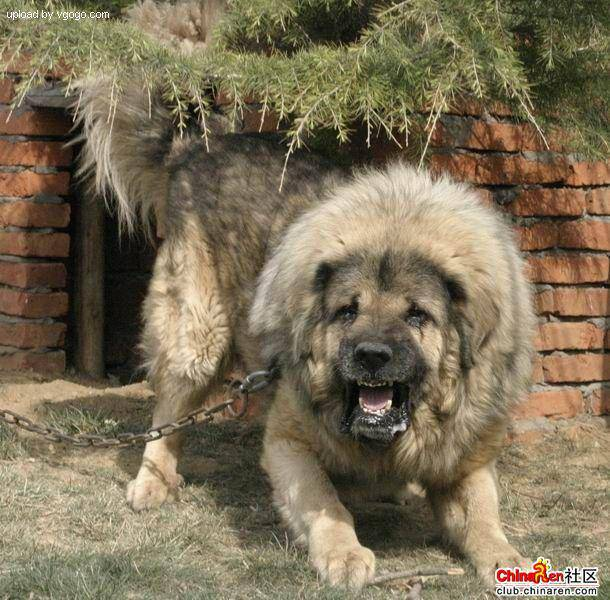

In [12]:
# One more check
Image(filenames[9000])

In [13]:
labels_csv['breed'][9000]

'tibetan_mastiff'

Since we have our training image filepaths in a list, let's prepare our labels

In [44]:
import numpy as np
labels = labels_csv['breed']
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [15]:
len(labels)

10222

In [16]:
# see if number of labels matches the number of file names
if len(labels) == len(filenames):
  print('Number of labels matches the number of filenames!!')
else:
  print('Number of labels does not match number of file names, check the directories!')

Number of labels matches the number of filenames!!


In [45]:
from tensorflow.python.ops.gen_array_ops import unique
# Find the unique labels values
unique_breeds = np.unique(labels)
print(unique_breeds), len(unique_breeds)

['affenpinscher' 'afghan_hound' 'african_hunting_dog' 'airedale'
 'american_staffordshire_terrier' 'appenzeller' 'australian_terrier'
 'basenji' 'basset' 'beagle' 'bedlington_terrier' 'bernese_mountain_dog'
 'black-and-tan_coonhound' 'blenheim_spaniel' 'bloodhound' 'bluetick'
 'border_collie' 'border_terrier' 'borzoi' 'boston_bull'
 'bouvier_des_flandres' 'boxer' 'brabancon_griffon' 'briard'
 'brittany_spaniel' 'bull_mastiff' 'cairn' 'cardigan'
 'chesapeake_bay_retriever' 'chihuahua' 'chow' 'clumber' 'cocker_spaniel'
 'collie' 'curly-coated_retriever' 'dandie_dinmont' 'dhole' 'dingo'
 'doberman' 'english_foxhound' 'english_setter' 'english_springer'
 'entlebucher' 'eskimo_dog' 'flat-coated_retriever' 'french_bulldog'
 'german_shepherd' 'german_short-haired_pointer' 'giant_schnauzer'
 'golden_retriever' 'gordon_setter' 'great_dane' 'great_pyrenees'
 'greater_swiss_mountain_dog' 'groenendael' 'ibizan_hound' 'irish_setter'
 'irish_terrier' 'irish_water_spaniel' 'irish_wolfhound'
 'italian

(None, 120)

In [18]:
#turn every label into boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [19]:
len(boolean_labels)

10222

In [20]:
# Example: turning boolean array into integers
print(labels[0])# original labels
print(np.where(unique_breeds == labels[0])) #index where label occurs
print(boolean_labels[0].argmax())#index where label occurs in boolean array
print(boolean_labels[0].astype(int))#there will be a 1 hwere the sample label occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [21]:
print(labels[2])
print(boolean_labels[2].astype(int))

pekinese
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [22]:
filenames[:10]

['drive/My Drive/dog identification project/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/My Drive/dog identification project/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/My Drive/dog identification project/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/My Drive/dog identification project/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/My Drive/dog identification project/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/My Drive/dog identification project/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/My Drive/dog identification project/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/My Drive/dog identification project/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/My Drive/dog identification project/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/My Drive/dog identification project/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

### Creating our own validation set

Since Kaggle did not provide a validation set. we will create our own.

In [23]:
# set uo x and y variables
x = filenames
y = boolean_labels

In [24]:
len(filenames)

10222

We are going to start with 1000 images to expirement with and increase as needed.

In [25]:
# set number of images to use for experimenting
NUM_IMAGES = 1000 #@param{type:'slider',min:100,max:10000}

In [26]:
from sklearn.model_selection import train_test_split

#Split into trainin and validation set
x_train, x_val, y_train, y_val =train_test_split(x[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                 test_size=.2,
                                                 random_state=42)
len(x_train),len(y_train), len(x_val), len(y_val)

(800, 800, 200, 200)

In [27]:
# check the training data
x_train[:3],y_train[:3]

(['drive/My Drive/dog identification project/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/My Drive/dog identification project/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/My Drive/dog identification project/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         

## Preprocessing images (turning images into Tensors)

To preprocess our images into Tensors we will write a function to do a few things:
1. Take an image filepath as input
2. Use TensorFLow to read the file and save it to a variable, `image`
3. turn our `image` (a jpg) into Tensors
4. Normalize our `image` convert color from 0-255 to 0-1
5. Resize the `image` to be a shape of (224,224)
6. Return the modified `imaage`

Before we do let's look at what an image looks like

In [9]:
# Convert an image to NumPy array
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

NameError: ignored

In [29]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [30]:
image.max(), image.min()

(255, 0)

In [31]:
# turn image into tensors
tf.constant(image)

<tf.Tensor: shape=(257, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  5

Now we have seen what an image looks like as a Tensor, lets make a function to preprocess them.

To preprocess our images into Tensors we will write a function to do a few things:

Take an image filepath as input
Use TensorFLow to read the file and save it to a variable, image
turn our image (a jpg) into Tensors
Resize the image to be a shape of (224,224)
Return the modified imaage

In [10]:
# Define image size
IMG_SIZE = 224

# create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns it into a Tensor
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # turn jpeg into numerical Tensor with 3 color channels (red, green, blue)
  image = tf.image.decode_jpeg(image, channels=3)
  # convert the color channel values from 0-255 to 0-1 values
  image = tf.image.convert_image_dtype(image, tf.float32)
  # resize the image to our desired value (224,224)
  image = tf.image.resize(image, size = [IMG_SIZE,IMG_SIZE])

  return image

## Turning our data into batches

Why turn our data into batches?

if we do too many at one time it might not fit into memory.
So use 32 and that can be adjusted later if necessary.

In order to udes TensorFlow effectivly, we need our data in the form of Tensor tuples which look like this: `(image, label)`

In [11]:
# create a functin to return a tuple of Tensors `(image, label)`
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns the tuple of `(image, label)`
  """
  image = process_image(image_path)
  return(image, label)

In [12]:
# Demo of above
process_image(x[42]),tf.constant(y[42])

NameError: ignored

Now have a way to get the data into tuples of Tensors in the form `(image, label)` let's make a functin to turn all our data `(x & y)` into batches!

In [7]:
# define the batch size, 332 is a good start
BATCH_SIZE = 32

# Create a function to turn data into batches
def create_data_batches(x, y=None,batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image(x) and label(y) pairs.
  Shuffles the data if it is training data but doesn't shuffle if it is validation data.
  Also accepts test data as input (no labels).
  """
  # if the data is test data, we do not have labels
  if test_data:
    print('Creating test data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x))) # only file paths no labels
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch
  # if the data is a valid dataset, we do not need to shuffle it
  elif valid_data:
    print('Creating validation data batches...')
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x), #filepaths
                                             tf.constant(y)))#labels
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("creating training data batches...")
    #turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(x),
                                               tf.constant(y)))
    # Shuffle pathnames and labels before mapping image fucntion is faster than shuffling the images
    data = data.shuffle(buffer_size=len(x))
    # create (image,label) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)
    #turn the training data into batches
    data_batch = data.batch(BATCH_SIZE)
  return data_batch




In [36]:
# Create training and validation sata batches
train_data = create_data_batches(x_train,y_train)
val_data = create_data_batches(x_val, y_val,valid_data=True)

creating training data batches...
Creating validation data batches...


In [37]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## VIsualizing data batches

Our data is now in batches however these can be hard to understand/comprehend. Lets visualize them

In [13]:
import matplotlib.pyplot as plt

# create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch
  """
  # setup the figures
  plt.figure(figsize=(10,10))
  #loop through 25 (for displaying 25 images)
  for i in range(25):
    #create subplots
    ax = plt.subplot(5,5, i+1)
    plt.imshow(images[i])
    #add image as title
    plt.title(unique_breeds[labels[i].argmax()])
    #turn grid lines off
    plt.axis('off')

In [39]:
train_images, train_labels = next(train_data.as_numpy_iterator())
train_images, train_labels

(array([[[[7.16299117e-02, 7.16299117e-02, 7.16299117e-02],
          [6.80934936e-02, 6.80934936e-02, 6.80934936e-02],
          [7.84313753e-02, 7.84313753e-02, 7.84313753e-02],
          ...,
          [1.95395812e-01, 1.95395812e-01, 1.95395812e-01],
          [1.88235313e-01, 1.88235313e-01, 1.88235313e-01],
          [1.88235313e-01, 1.88235313e-01, 1.88235313e-01]],
 
         [[7.86273107e-02, 7.86273107e-02, 7.86273107e-02],
          [6.74120486e-02, 6.74120486e-02, 6.74120486e-02],
          [7.42720589e-02, 7.42720589e-02, 7.42720589e-02],
          ...,
          [1.95685327e-01, 1.95685327e-01, 1.95685327e-01],
          [1.91561639e-01, 1.91561639e-01, 1.91561639e-01],
          [1.91561639e-01, 1.91561639e-01, 1.91561639e-01]],
 
         [[8.15743655e-02, 8.15743655e-02, 8.15743655e-02],
          [6.09170347e-02, 6.09170347e-02, 6.09170347e-02],
          [6.99329004e-02, 6.99329004e-02, 6.99329004e-02],
          ...,
          [1.95764571e-01, 1.95764571e-01, 1.9576

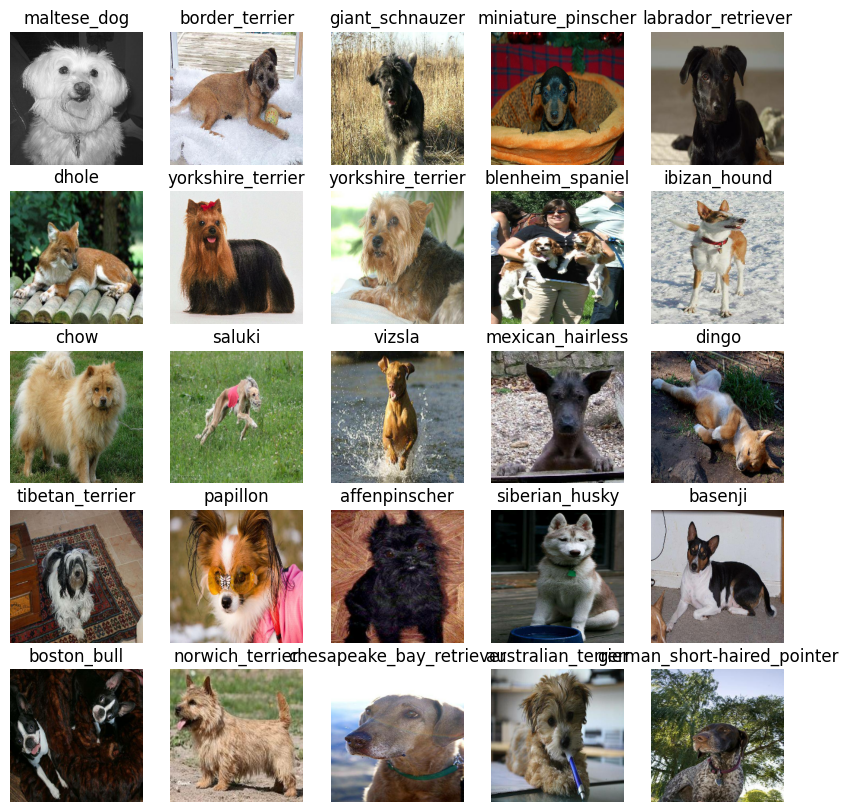

In [40]:
#now lets visualize the data in the training batch
show_25_images(train_images,train_labels);

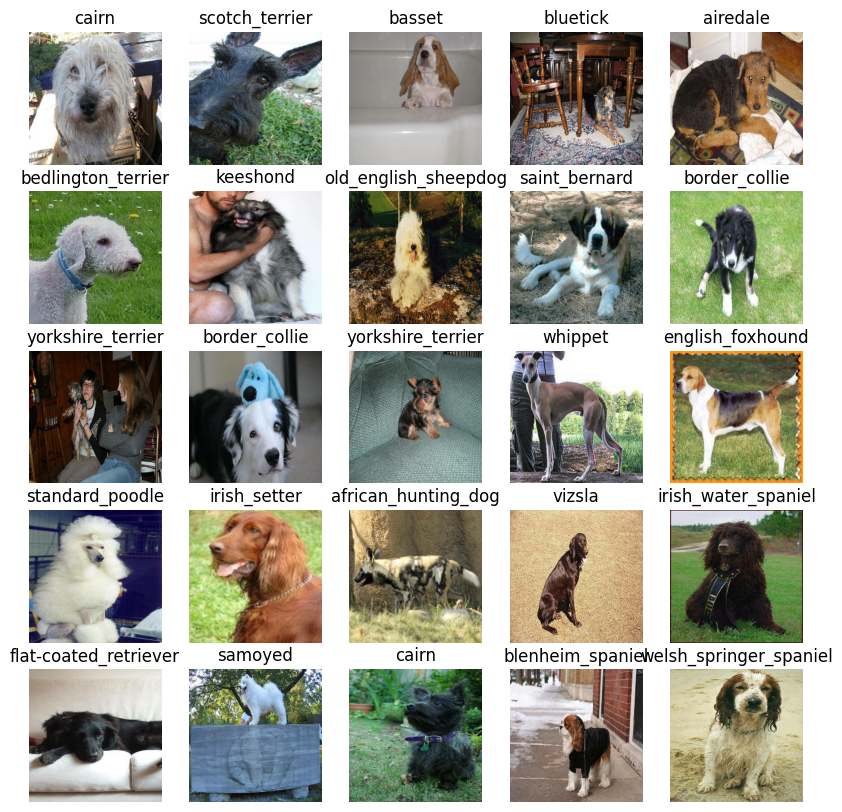

In [41]:
# now lets visualize our validation data set.
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

## Building a model

Before we build a model, there are a few things we need to define:
* input shape (our images shape, in the form of Tensors) to our model
* the output shape (image labels in the form of Tensors) of our model
* the URL of the model we want to use from TensorFlow Hub https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5

In [42]:
# Set up input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3] # batch, hight, width, color channels
# Output shape set up
OUTPUT_SHAPE = len(unique_breeds)
# Setup model url from TensorFlow Hub
MODEL_URL = 'https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5'

Now we have inputs, outputs and model ready to go.
Let's put them into a Keras deep learning model!
* Knowing this let's create a function that takes the input shape, output shape and model we have chosen as parameters
* Defines the layers in a keras model in a sequential fasion. (do this first, then this, then that)
* Compiles the model (says it should be evaluated and improved.
* Builds the model (tells the model the input shape it'll be getting
* returns the model
* all steos can be found here: https://www.tensorflow.org/guide/keras

In [43]:
## Create a function which builds a Keras model
def create_model(input_shape=INPUT_SHAPE,output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print('Building model with:', MODEL_URL)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # layer 1 input layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation='softmax') # layer 2 output layer
  ])
  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=['accuracy']
  )
  # build the model
  model.build(INPUT_SHAPE)

  return model

In [44]:
model = create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


## Creating callbacks
callbacks are helper functions that a model can use during training to do things such as save it's progress, check it's progress or stop it's progress if it stops improving.
the call backs are:
1. TensorBoard which helps track progress
2. Early stopping to keep from overfitting or training for too long

### TensorBoard

To set up TensorBoard call back we need three things
1. Load the extension
2. Create a TensorBoard call back which can save logs to a directory and pass it tou our models `fit()` function.
3. Visualize our model training logs with the `%tensorboard` magic functin. (after model training)

In [45]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [46]:
import datetime

# create a function to build TensorBoard callback

def create_tensorboard_callback():
  # create a log directory for storing TensorBoard logs
  logdir = os.path.join('drive//My Drive/dog identification project/Logs',
                        #make it so logs get tracked whenever an experiment is run
                        datetime.datetime.now().strftime('%Y%m%d-%H%M%S'))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early stopping callback

Early stopping helps stop our model from overfitting if a certain evaluation metric stops improving

In [47]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor= 'val_accuracy',
                                                  patience=3)

## Training a model (on a subset of data)

Our first model will only train on 1000 images to make sure everything works

In [48]:
NUM_EPOCHS = 100 #@param {type: "slider", min:10, max:100,step:10}

In [49]:
# Check to make sure we are still running on a gpu
print('GPU', 'available (YESS!!!!!!)' if tf.config.list_physical_devices('GPU') else 'not available :(')

GPU available (YESS!!!!!!)


write a function to train a model
* create a model using `create_model()`
* setup a TensorBoard callback using `create_tensorboard_callback()`
* call `fit()` function on our model passing it the training data, validation data, number of epochs to train (`NUM_EPOCHS`) and the callbacks we are using
* return the model

In [50]:
# build a function to train and return a trained model
def trained_model():
  """
  Trains a given model and returns the trained version
  """
  model = create_model()

  # create new TensorBoard session for each model we train
  tensorboard = create_tensorboard_callback()

  # fit the model to the data passing it the callback we created

  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard, early_stopping])
  #return the fitted model
  return model



In [51]:
model = trained_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 440s 17s/step - loss: 4.6288 - accuracy: 0.0962 - val_loss: 3.4572 - val_accuracy: 0.2350
Epoch 2/100
25/25 [==============================] - 3s 111ms/step - loss: 1.6624 - accuracy: 0.6737 - val_loss: 2.2015 - val_accuracy: 0.4750
Epoch 3/100
25/25 [==============================] - 3s 106ms/step - loss: 0.5723 - accuracy: 0.9325 - val_loss: 1.6721 - val_accuracy: 0.5950
Epoch 4/100
25/25 [==============================] - 4s 153ms/step - loss: 0.2551 - accuracy: 0.9862 - val_loss: 1.4849 - val_accuracy: 0.6600
Epoch 5/100
25/25 [==============================] - 3s 130ms/step - loss: 0.1488 - accuracy: 0.9975 - val_loss: 1.3966 - val_accuracy: 0.6550
Epoch 6/100
25/25 [==============================] - 3s 109ms/step - loss: 0.0999 - accuracy: 0.9987 - val_loss: 1.3445 - val_accuracy: 0.6700
Epoch 7/100
25/25 [==============================

### Checking the TensorBoard logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory and visualize it's contents

In [52]:
%tensorboard --logdir drive/My\ Drive/dog\ identification\ project/Logs

Output hidden; open in https://colab.research.google.com to view.

## Makiung and evaluating predictins using a trained model

In [53]:
# Make predictions on validation data (not used to train)

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 4s 109ms/step


array([[1.46615016e-03, 2.19115027e-05, 2.36951048e-04, ...,
        4.74100088e-04, 5.56774175e-05, 4.37914906e-03],
       [2.77001271e-03, 2.44364986e-04, 4.48040152e-03, ...,
        6.94642600e-04, 9.82261728e-04, 5.56545201e-05],
       [5.33373459e-05, 1.83110285e-04, 9.30370661e-05, ...,
        6.64595631e-04, 1.27807085e-04, 2.25511700e-04],
       ...,
       [3.40354495e-06, 1.82241802e-05, 3.57507342e-05, ...,
        5.27022712e-06, 6.68667144e-06, 2.94687015e-05],
       [4.08031000e-03, 1.37764306e-04, 1.70631291e-04, ...,
        1.01330064e-04, 5.18613961e-05, 3.24059743e-03],
       [2.28908539e-04, 1.55822068e-04, 4.10487293e-04, ...,
        2.98566394e-03, 7.67022197e-04, 1.69235296e-04]], dtype=float32)

In [54]:
len(predictions[0])

120

In [55]:
predictions.shape

(200, 120)

In [56]:
# first prediction
index = 10
print(predictions[index])
print(f'Max value (propability of prediction): {np.max(predictions[index])}')
print(f'Sum: {np.sum(predictions[index])}')
print(f'Max index: {np.argmax(predictions[index])}')
print(f'Predictied label: {unique_breeds[np.argmax(predictions[index])]}')

[2.0409795e-04 1.6071834e-01 8.3410241e-06 1.2514730e-04 1.2676361e-04
 1.6506638e-06 2.2039961e-03 1.4853490e-03 2.5775016e-05 2.8249578e-04
 7.9804231e-05 4.9286068e-04 8.1571270e-06 2.0403964e-04 1.6049709e-05
 2.7732659e-04 5.6694544e-06 3.9631524e-04 3.2283144e-05 5.4274245e-05
 1.7678793e-04 7.8744488e-06 1.7397713e-06 4.7412344e-05 6.7136465e-03
 2.9975986e-06 1.9956889e-04 1.5874712e-05 3.5627061e-05 2.9441380e-05
 2.3550733e-06 9.4820393e-07 9.7235068e-05 4.7997100e-06 1.3909265e-06
 1.1220363e-01 3.0574074e-07 5.4493294e-06 6.2621821e-06 1.1139724e-05
 1.1761428e-04 7.1774980e-06 3.3039100e-07 1.2043903e-05 4.8524984e-05
 4.9093279e-07 1.4420096e-05 7.1487902e-04 6.7759334e-05 7.3815254e-06
 9.0176923e-07 5.5092014e-06 4.4344476e-04 3.8106589e-09 2.4905424e-07
 2.1451287e-06 5.6245726e-06 2.9705314e-02 1.5342421e-06 9.2668332e-02
 2.5919031e-02 6.8620330e-04 1.0820518e-04 3.2245913e-05 1.3574352e-06
 8.0752125e-06 2.0391426e-05 5.9875319e-06 2.8503421e-01 2.2240133e-06
 1.794

Having the above functinality is great but we want to be able to do it at scale.
It would be even better if we can see the image the prediction is being made on.

**Note:** predictin probabilities are also know as confidence levels

In [32]:
# turn probabilities into their respective labels
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilites into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

# get a predicted label based on an array of prediction probabilities
pred_label = get_pred_label(predictions[0])
pred_label

Because our validation data is still in a batch dataset, we habe to unbatch it to make prediction son the validation images and then compare those predictions to the validation labels(truth labels)

In [58]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [59]:
# create a function to inbatch a dataset
def unbatchify(data):
  """
  Takes a batched dataset of (image, label) Tensors and returns seperate arrays of images and labels
  """
  images = []
  labels = []

  #loop through the unbatched data
  for image, label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])
  return images, labels

# unbatchify the validation data
val_images, val_labels = unbatchify(val_data)
val_images[0],val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [60]:
get_pred_label(predictions[0])

'cairn'

No we have ways to get:
* predictin labels
* validation labels  
* validation images

lets make some functin sto make this more visual.
We will create a function that:
* takes an array of prediction probabilities, an array of trith labels and an arrau of images and integer.
* convert the prediction probabiliteis to predicted label
* plot the predicted label, its predicted probability and the target image on a single plot.

In [61]:
def plot_pred(prediction_probabilities, labels,images,n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n],images[n]

  # get the pred label
  pred_label = get_pred_label(pred_prob)

  # plot the image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # change the color of title depending on if the prediction is right or wrong.
  if pred_label == true_label:
    color = 'green'
  else:
    color = 'red'


  # change plot title to be predicted, probability of prediction and truth
  plt.title('{} {:2.0f}% {}'.format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label),
                                    color = color)

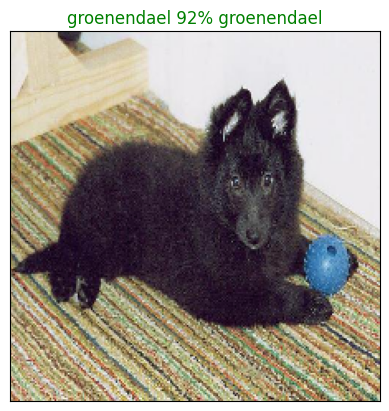

In [62]:
plot_pred(prediction_probabilities=predictions,
          labels= val_labels,
          images=val_images,
          n=77)

Now we have a function to visualize our models predictions. Lets make another to view our top 10 predictions.
This function will:
* take an input of prediction probabilities array and a ground truth arrya and an integer
* find the prediciton using `get_pred_label()`
* find the top 10:
  * prediction probabilities indexes
  * prediction probabilities values
  * prediction labels
* plot the top 10 prediction probability values and labels, coloring the true label green


In [63]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  plot the top 10 highest prediciton confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # get the predicted label
  pred_label = get_pred_label(pred_prob)

  # find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # find the top 10 confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]
  # set up plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                     top_10_pred_values,
                     color='grey')
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation = 'vertical')
  # change color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color('green')
  else:
      pass


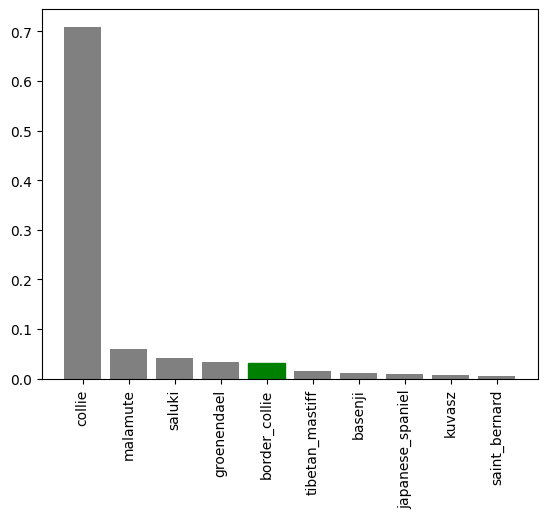

In [64]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we have some functions to help us visualize our predictions and evaluate our model let's check out a few.


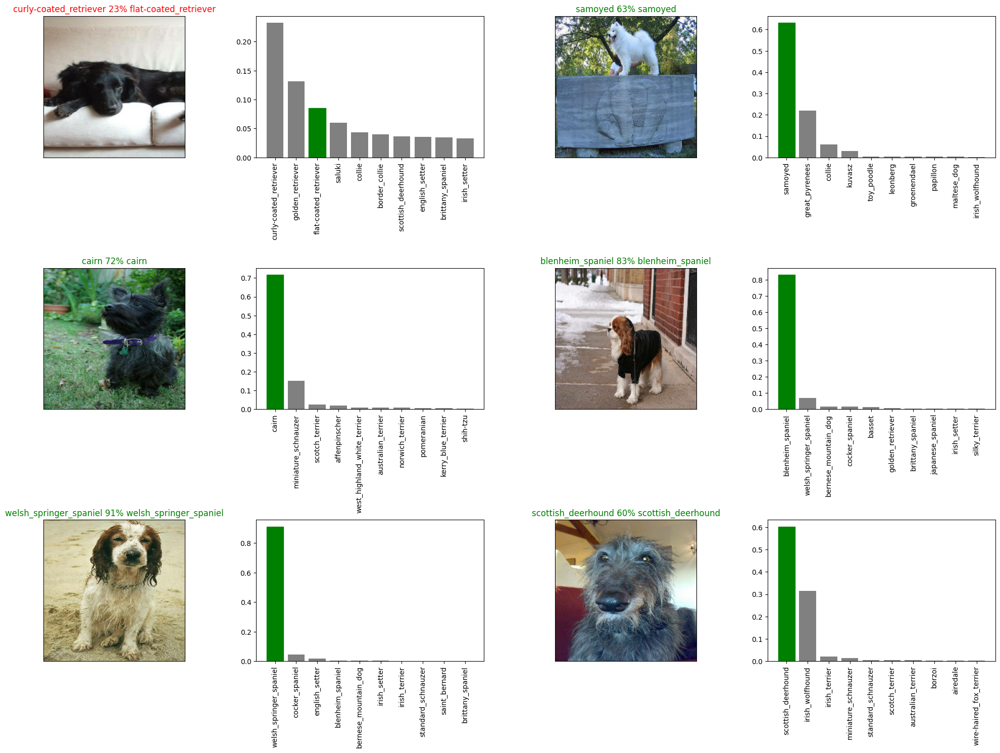

In [65]:
# let's check a few predictions and their different values
i_multiplier = 20
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a model



In [66]:
# create a function to save a model
def save_model(model,suffix=None):
  """
  Saves a given model in a Models directory and appends a suffix (string).
  """
  # create a model directory pathname with current time
  modeldir = os.path.join('drive/My Drive/dog identification project/Models',
                          datetime.datetime.now().strftime('%Y%m%d-%H%M%s'))
  model_path = modeldir + '-' + suffix + '.h5' #save format of model
  print(f'saving model to : {model_path}...')
  model.save(model_path)
  return model_path

In [40]:
# create a function to load a trained model
def load_model(model_path):
  """
  Loads a saved model from specified path
  """
  print(f"Loading a saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                    custom_objects={'KerasLayer':hub.KerasLayer})
  return model


Now we have functions to save and load a trained model let's make sure they work

In [68]:
# save our model trained on 1000 images
save_model(model, suffix='1000-images-mobilenetv2-Adam')

saving model to : drive/My Drive/dog identification project/Models/20231114-17061699981569-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3079: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/dog identification project/Models/20231114-17061699981569-1000-images-mobilenetv2-Adam.h5'

In [69]:
loaded_1000_images_model = load_model('drive/My Drive/dog identification project/Models/20231112-19491699818585-1000-images-mobilenetv2-Adam.h5')

Loading a saved model from: drive/My Drive/dog identification project/Models/20231112-19491699818585-1000-images-mobilenetv2-Adam.h5


In [70]:
# Evaluate the pre_saves model
model.evaluate(val_data)

7/7 [==============================] - 1s 122ms/step - loss: 1.2120 - accuracy: 0.7050


[1.2119892835617065, 0.7049999833106995]

In [71]:
loaded_1000_images_model.evaluate(val_data)

7/7 [==============================] - 2s 110ms/step - loss: 1.2898 - accuracy: 0.6350


[1.28984797000885, 0.6349999904632568]

## Training a big dog model (on the full data)

In [72]:
len(x), len(y)

(10222, 10222)

In [73]:
# create a data batch with the full data set
full_data = create_data_batches(x,y)

creating training data batches...


In [74]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [75]:
# create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [76]:
# create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data so we cannot monitor accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor='accuracy',
                                                             patience=3)

**Note:** Running the cell below will take a little while (maybe up to 30 minutes the first epoch). because the GPU needs to load all of the images into memory.

In [77]:
# fit the full model to the full data
# full_model.fit(x=full_data,
#                epochs=NUM_EPOCHS,
#                callbacks = [full_model_tensorboard,full_model_early_stopping])

In [78]:
save_model(full_model,suffix='trained-on-full-data-mobilenetv2-Adam')

saving model to : drive/My Drive/dog identification project/Models/20231114-17061699981582-trained-on-full-data-mobilenetv2-Adam.h5...


'drive/My Drive/dog identification project/Models/20231114-17061699981582-trained-on-full-data-mobilenetv2-Adam.h5'

In [20]:
full_model = load_model('drive/My Drive/dog identification project/Models/20231112-19521699818777-trained-on-full-data-mobilenetv2-Adam.h5')

Loading a saved model from: drive/My Drive/dog identification project/Models/20231112-19521699818777-trained-on-full-data-mobilenetv2-Adam.h5


## Making predictions on the test dataset

Because our model has been trained on Tensor batches we have to get the test data into the same format.

Luckily we created `create_data_baatches()` earlier which can take a list of filenames as input and convert them into Tensor Batches.

To make predictions on the tes data:
* get the test image filenames
* convert the filenames into test data batches using `create_data_batches()` and set the `test_data` parameter to `True` (since the data is test data and doesnt have labels)
* make predictions array by passing the test batches into `predict()` called on our model.



In [80]:
# load test image filenames
test_path = 'drive/My Drive/dog identification project/test/'
test_filenames = [test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/My Drive/dog identification project/test/e587c21aedc81f89b83dd326e034e7e0.jpg',
 'drive/My Drive/dog identification project/test/dcfd3463e1d23d51b309b0385292870b.jpg',
 'drive/My Drive/dog identification project/test/e0165801e47527205e45295aba441972.jpg',
 'drive/My Drive/dog identification project/test/ddf2401701ee374c0f1f9dd607071ec7.jpg',
 'drive/My Drive/dog identification project/test/e0a6b866af64299ecf76f7cb11c80674.jpg',
 'drive/My Drive/dog identification project/test/dfc5d207b533d381045984a0a0adb23c.jpg',
 'drive/My Drive/dog identification project/test/dea92807aa2ac37bbc2dabf1b0eb6a39.jpg',
 'drive/My Drive/dog identification project/test/e5a78d4d53fc5957cc9dedd318139d3d.jpg',
 'drive/My Drive/dog identification project/test/dd3eb4338145e614d325a917a35e5a1e.jpg',
 'drive/My Drive/dog identification project/test/e0f2620cb1ebf648b986c8a09dbd3664.jpg']

In [81]:
len(test_filenames)

10357

In [82]:
# create test data batches
test_data = create_data_batches(test_filenames, test_data=True)

Creating test data batches...


In [83]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** calling `predict()` on our full model and passing it the test data batch will take a long time. about an ~hour.

In [84]:
# make predictions on test data batch usign the loaded full model
test_predictions = full_model.predict(test_data,
                                      verbose=1)

324/324 [==============================] - 243s 697ms/step


In [85]:
# Check out the test predictions
test_predictions[:10]

array([[1.5661399e-09, 6.1652135e-11, 3.1913774e-11, ..., 4.2476871e-09,
        4.1228642e-08, 2.7599334e-10],
       [1.7425689e-15, 9.9999011e-01, 6.4863268e-13, ..., 5.8046047e-11,
        2.0938780e-10, 1.3296676e-11],
       [7.4431000e-10, 3.2289644e-12, 1.5668181e-13, ..., 1.4634741e-06,
        1.7129799e-13, 2.7999616e-13],
       ...,
       [3.7013049e-12, 5.2421675e-11, 5.1161489e-13, ..., 7.4535465e-12,
        8.4327411e-07, 6.7431776e-12],
       [6.5678796e-11, 5.0962741e-15, 4.0119301e-12, ..., 3.2527654e-13,
        1.3703801e-08, 3.3539546e-08],
       [3.9661878e-19, 1.1896693e-15, 1.7758219e-17, ..., 7.4100249e-12,
        1.8739327e-17, 1.3443513e-19]], dtype=float32)

## Preparing test dataset predictions for Kaggle
Looking at the Kaggle sample submission, it looks like they want the models output probabilities each for label along with the image ID's.

To get the data in this format, we'll:

* Create a pandas DataFrame with an ID column as well as a column for each dog breed.
* Add data to the ID column by extracting the test image ID's from their filepaths.
* Add data (the prediction probabilities) to each of the dog breed columns using the unique_breeds list and the test_predictions list.
* Export the DataFrame as a CSV to submit it to Kaggle

In [101]:
preds_df = pd.DataFrame(columns = ['id'] + list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [102]:
# Append test image ID's to predictions DataFrame
test_path = 'drive/My Drive/dog identification project/test/'
preds_df['id'] = [os.path.splitext(path)[0] for path in  os.listdir(test_path)]
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e587c21aedc81f89b83dd326e034e7e0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,dcfd3463e1d23d51b309b0385292870b,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e0165801e47527205e45295aba441972,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,ddf2401701ee374c0f1f9dd607071ec7,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e0a6b866af64299ecf76f7cb11c80674,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [103]:
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e587c21aedc81f89b83dd326e034e7e0,1.566140e-09,6.165213e-11,3.191377e-11,5.202105e-08,1.834212e-09,3.560344e-09,3.053462e-12,3.113104e-12,8.364424e-08,...,1.453180e-05,2.611488e-10,1.225919e-07,3.609353e-10,1.943862e-08,2.023059e-13,3.461729e-12,4.247687e-09,4.122864e-08,2.759933e-10
1,dcfd3463e1d23d51b309b0385292870b,1.742569e-15,9.999901e-01,6.486327e-13,9.724967e-10,3.166862e-13,6.855214e-13,6.518983e-13,1.450615e-12,1.009548e-13,...,3.259043e-13,3.627810e-15,1.304233e-15,5.256461e-11,2.076176e-11,5.474480e-12,9.167997e-15,5.804605e-11,2.093878e-10,1.329668e-11
2,e0165801e47527205e45295aba441972,7.443100e-10,3.228964e-12,1.566818e-13,6.699778e-08,1.270441e-06,3.864225e-12,6.294245e-09,8.787840e-08,1.820271e-09,...,2.460310e-13,1.279009e-10,8.627419e-07,2.661816e-11,5.769304e-14,1.752308e-13,1.148733e-15,1.463474e-06,1.712980e-13,2.799962e-13
3,ddf2401701ee374c0f1f9dd607071ec7,7.740129e-08,2.163301e-06,2.381537e-11,1.124152e-10,3.068507e-10,1.181901e-07,8.938375e-13,1.002028e-10,4.378727e-12,...,3.619307e-08,1.469203e-10,5.394462e-11,2.162672e-12,9.695995e-11,2.691284e-11,2.921487e-09,3.810695e-08,1.793007e-08,2.161535e-03
4,e0a6b866af64299ecf76f7cb11c80674,2.591049e-13,2.398269e-08,1.676391e-10,4.765250e-04,7.521937e-11,1.282705e-11,1.142899e-05,1.748368e-07,2.979349e-11,...,2.881842e-10,5.454933e-09,1.429965e-08,5.683761e-11,1.008223e-11,1.875195e-12,6.492508e-11,2.645927e-06,2.307128e-08,1.125327e-12


## Export the DataFrame to a csv file

In [104]:
preds_df.to_csv('drive/My Drive/dog identification project/full_submission_1_mobilienetV2_adam.csv',
                index = False)


In [78]:
import os
custom_path = 'drive/My Drive/dog identification project/Dogs/'
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]

In [87]:
# Turn custom image into batch (set to test data because there are no labels)
custom_data = create_data_batches(custom_image_paths, test_data = True)

Creating test data batches...


In [88]:
# Make predictions on the custom data# Get custom image prediction labels
custom_pred_labels = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]
custom_preds = full_model.predict(custom_data)

1/1 [==============================] - 0s 240ms/step


In [89]:

# Get custom images (our unbatchify() function won't work since there aren't labels)
custom_images = []
# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)

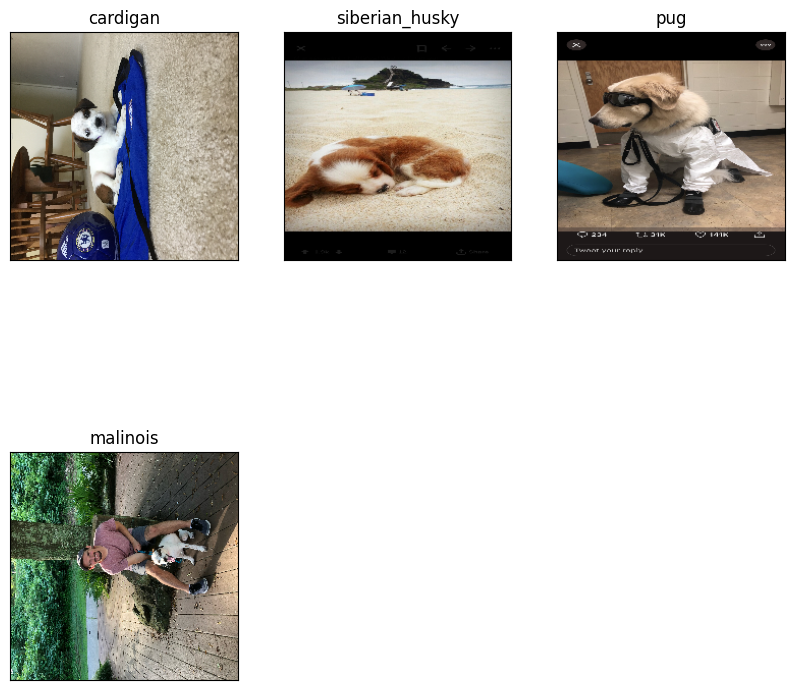

In [90]:
# Check custom image predictions
plt.figure(figsize=(10, 10))
for i, image in enumerate(custom_images):
  plt.subplot(2, 3, i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_pred_labels[i])
  plt.imshow(image)